In [ ]:
!wget https://data.keithito.com/data/speech/LJSpeech-1.1.tar.bz2
!tar -xjf LJSpeech-1.1.tar.bz2

--2021-12-19 19:46:48--  https://data.keithito.com/data/speech/LJSpeech-1.1.tar.bz2
Resolving data.keithito.com (data.keithito.com)... 174.138.79.61
Connecting to data.keithito.com (data.keithito.com)|174.138.79.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2748572632 (2.6G) [application/octet-stream]
Saving to: ‘LJSpeech-1.1.tar.bz2’

LJSpeech-1.1.tar.bz 100%[===================>]   2.56G   140MB/s    in 24s     

2021-12-19 19:47:12 (111 MB/s) - ‘LJSpeech-1.1.tar.bz2’ saved [2748572632/2748572632]



In [ ]:
!pip install librosa


In [ ]:
!pip install torch==1.10.0+cu111 torchaudio==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html


Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [ ]:
from IPython import display
from dataclasses import dataclass

import torch
from torch import nn

import torchaudio

import librosa
from matplotlib import pyplot as plt


@dataclass
class MelSpectrogramConfig:
    sr: int = 22050
    win_length: int = 1024
    hop_length: int = 256
    n_fft: int = 1024
    f_min: int = 0
    f_max: int = 8000
    n_mels: int = 80
    power: float = 1.0
    center: bool = False

class MelSpectrogramConfig_loss:
    sr: int = 22050
    win_length: int = 1024
    hop_length: int = 256
    n_fft: int = 1024
    f_min: int = 0
    f_max: int = None
    n_mels: int = 80
    power: float = 1.0
    center: bool = False

class MelSpectrogram(nn.Module):

    def __init__(self, config: MelSpectrogramConfig):
        super(MelSpectrogram, self).__init__()

        self.config = config
        self.mel_spectrogram = torchaudio.transforms.MelSpectrogram(
            sample_rate=config.sr,
            win_length=config.win_length,
            hop_length=config.hop_length,
            n_fft=config.n_fft,
            f_min=config.f_min,
            f_max=config.f_max,
            n_mels=config.n_mels,
            center = config.center
        )

        self.mel_spectrogram.spectrogram.power = config.power


        mel_basis = librosa.filters.mel(
            sr=config.sr,
            n_fft=config.n_fft,
            n_mels=config.n_mels,
            fmin=config.f_min,
            fmax=config.f_max
        ).T
        self.mel_spectrogram.mel_scale.fb.copy_(torch.tensor(mel_basis))

    def forward(self, audio: torch.Tensor) -> torch.Tensor:
        """
        :param audio: Expected shape is [B, T]
        :return: Shape is [B, n_mels, T']
        """
        audio = torch.nn.functional.pad(audio.unsqueeze(1), (int((self.config.n_fft-self.config.hop_length)/2), int((self.config.n_fft-self.config.hop_length)/2)), mode='reflect')
        mel = self.mel_spectrogram(audio) \
            .clamp_(min=1e-5) \
            .log_()

        return mel

In [ ]:
device = "cuda"

In [ ]:
import random


In [ ]:
class LJSpeechDataset(torchaudio.datasets.LJSPEECH):

    def __init__(self, root, mel_config, mel_config_loss, device ):
        super().__init__(root=root)
        self.segment_size = 8192
        self.split = True
        self.featurizer = MelSpectrogram(mel_config).to(device)
        self.featurizer_loss = MelSpectrogram(mel_config_loss).to(device)

    def __getitem__(self, index: int):
        waveform, _, _,  transcript = super().__getitem__(index)
        waveforn_length = torch.tensor([waveform.shape[-1]]).int()
        waveform = waveform.to(device)

        if self.split:
            if waveform.size(1) >= self.segment_size:
                max_audio_start = waveform.size(1) - self.segment_size
                audio_start = random.randint(0, max_audio_start)
                waveform = waveform[:, audio_start:audio_start+self.segment_size]
            else:
                waveform = torch.nn.functional.pad(waveform, (0, self.segment_size - waveform.size(1)), 'constant')
            mel = self.featurizer(waveform.to(device))

            mel_loss = self.featurizer_loss(waveform.to(device))

        return waveform.squeeze(0), mel.squeeze(), mel_loss.squeeze()

                

In [ ]:
class LJSpeechDataset_fullaudio(torchaudio.datasets.LJSPEECH):

    def __init__(self, root, mel_config, mel_config_loss, device ):
        super().__init__(root=root)
        self.segment_size = 8192
        self.split = True
        self.featurizer = MelSpectrogram(mel_config).to(device)
        self.featurizer_loss = MelSpectrogram(mel_config_loss).to(device)

    def __getitem__(self, index: int):
        waveform, _, _,  transcript = super().__getitem__(index)
        waveforn_length = torch.tensor([waveform.shape[-1]]).int()
        waveform = waveform.to(device)

        mel = self.featurizer(waveform.to(device))

        mel_loss = self.featurizer_loss(waveform.to(device))

        return waveform.squeeze(0), mel.squeeze(), mel_loss.squeeze()

In [ ]:
LJSpeechDataset('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device)[0]

(tensor([ 0.0072,  0.0071,  0.0075,  ..., -0.0114, -0.0442, -0.0684],
        device='cuda:0'),
 tensor([[-5.6907, -6.1585, -6.0395,  ..., -6.2253, -3.9472, -2.2289],
         [-5.5431, -5.4083, -5.5340,  ..., -5.6687, -4.0234, -2.2082],
         [-5.6895, -5.0618, -5.1392,  ..., -4.9990, -3.7065, -2.0559],
         ...,
         [-9.3437, -8.9230, -8.3430,  ..., -5.4471, -5.7897, -6.0003],
         [-8.9236, -8.5086, -7.7676,  ..., -5.1342, -5.2471, -5.3843],
         [-9.1704, -8.8157, -7.8582,  ..., -5.0209, -4.9485, -4.8295]],
        device='cuda:0'),
 tensor([[ -5.6349,  -6.0293,  -5.9110,  ...,  -6.1345,  -3.9380,  -2.2060],
         [ -5.4963,  -5.2815,  -5.4724,  ...,  -5.5846,  -3.9448,  -2.1643],
         [ -5.7735,  -5.2044,  -4.9741,  ...,  -3.9267,  -3.5545,  -1.9741],
         ...,
         [ -9.3450,  -8.7955,  -8.4977,  ...,  -5.1715,  -5.3280,  -5.6830],
         [ -9.6727,  -9.2580,  -8.6036,  ...,  -5.8374,  -5.7895,  -5.9423],
         [-10.4328,  -9.8592,  -9.0094

In [ ]:
from typing import Tuple, Dict, Optional, List, Union
from itertools import islice
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence
import torch.nn.functional as F


@dataclass
class Batch:
    waveform: torch.Tensor
    mels: torch.Tensor
    mel_loss: torch.Tensor


class LJSpeechCollator:
    def __call__(self, instances ) -> Dict:
        waveform, mels, mel_loss = list(zip(*instances))
        waveform = pad_sequence([
            waveform_ for waveform_ in waveform
        ]).transpose(0, 1)

        mels = pad_sequence([
            mels_ for mels_ in mels
        ]).transpose(0, 1)

        mel_loss = pad_sequence([
            mels_ for mels_ in mel_loss
        ]).transpose(0, 1)

        return Batch(waveform, mels, mel_loss)

In [ ]:
dataloader = DataLoader(LJSpeechDataset('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device), batch_size=1, collate_fn= LJSpeechCollator() )
dummy_batch = list(islice(dataloader, 1))[0]
dummy_batch

Batch(waveform=tensor([[-0.1694, -0.1905, -0.2160,  ...,  0.0161, -0.0899,  0.0995]],
       device='cuda:0'), mels=tensor([[[-4.1245, -5.6719, -5.6972,  ..., -6.1892, -6.4787, -6.3376],
         [-4.6901, -5.7061, -5.9362,  ..., -5.7688, -5.6979, -6.2828],
         [-5.1151, -5.4845, -5.9881,  ..., -6.0605, -5.6787, -5.9214],
         ...,
         [-4.3039, -4.2279, -4.6858,  ..., -2.6984, -2.5600, -2.5142],
         [-4.1445, -3.5936, -3.8434,  ..., -2.9617, -2.2761, -2.0744],
         [-5.0508, -4.4900, -4.3480,  ..., -2.9647, -2.8064, -2.2937]]],
       device='cuda:0'), mel_loss=tensor([[[-4.1259, -5.6507, -5.6573,  ..., -6.0906, -6.3535, -6.3358],
         [-4.9075, -5.7474, -6.0203,  ..., -5.8433, -5.6383, -6.2083],
         [-4.3775, -4.9958, -5.7446,  ..., -5.9321, -5.7207, -5.7514],
         ...,
         [-4.4436, -4.2751, -4.2931,  ..., -3.2960, -3.5282, -3.5957],
         [-5.4344, -5.1703, -5.0806,  ..., -3.9760, -3.7325, -3.7001],
         [-6.0510, -6.2531, -6.0955,  .

In [ ]:
display.display(display.Audio(dummy_batch.waveform[0].cpu(), rate=22050))


In [ ]:
# "upsample_rates": [8,8,2,2],
# "upsample_kernel_sizes": [16,16,4,4],
# "upsample_initial_channel": 512,
# "resblock_kernel_sizes": [3,7,11],
# "resblock_dilation_sizes": [[1,3,5], [1,3,5], [1,3,5]]

SyntaxError: ignored

In [ ]:
class config:
    MFT_block_dilations = [ [1, 1], [3, 1], [5, 1] ]
    leaky_relu = 0.1

In [ ]:
from torch.nn.utils import weight_norm, spectral_norm
from torchsummary import summary


In [ ]:
class MRF(nn.Module):
    def __init__(self, dim, kernel_size=3, deletions= (1, 3, 5), leaky_relu = 0.1):
        super(MRF, self).__init__()

        self.leaky_relu = leaky_relu
        self.conv1 = nn.ModuleList([
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * deletions[0] - deletions[0]) // 2, dilation = deletions[0])),
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * 1 - 1) // 2, dilation = 1))])

        self.conv2 = nn.ModuleList([
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * deletions[1] - deletions[1]) // 2, dilation = deletions[1])),
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * 1 - 1) // 2, dilation = 1))])

        self.conv3 = nn.ModuleList([
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * deletions[2] - deletions[2]) // 2, dilation = deletions[2])),
            weight_norm(nn.Conv1d(in_channels = dim, out_channels = dim, kernel_size = kernel_size, stride = 1, padding = (kernel_size * 1 - 1) // 2, dilation = 1))])


    def forward(self, x):
        for conv in (self.conv1, self.conv2, self.conv3):
            for index, layer in enumerate(conv):
                x_pr = F.leaky_relu(x if index == 0 else x_pr, self.leaky_relu)
                x_pr = layer(x_pr)
            x = x + x_pr
        return x

In [ ]:
class Generator(nn.Module):
    def __init__(self,leaky_relu = 0.1):
        super(Generator, self).__init__()
        upsample_rates = [8,8,2,2]
        upsample_kernel_sizes = [16,16,4,4]
        upsample_initial_channel = 128
        resblock_kernel_sizes = [3,7,11]
        resblock_dilation_sizes =  [[1,3,5], [1,3,5], [1,3,5]]
        self.len_upsample = len(upsample_rates)
        self.len_blocks = len(resblock_kernel_sizes)
        
        self.conv = nn.Conv1d(in_channels = 80, out_channels = upsample_initial_channel, kernel_size = 7, stride = 1, padding = 3)


        ls = []
        for i in range(self.len_upsample):
            indim = upsample_initial_channel // (2 ** i),
            outdim = upsample_initial_channel // (2 ** (i + 1))
            kernal = upsample_kernel_sizes[i]
            stride = upsample_rates[i]
            ls += [
                   nn.LeakyReLU(leaky_relu),
                   weight_norm(nn.ConvTranspose1d(indim[0], outdim, kernal, stride, (kernal - stride) //2))]
        self.generator = nn.ModuleList(ls)


        ls_MRF_bloacks = []
        for i in range(self.len_upsample):
            dim = upsample_initial_channel // 2 ** (i + 1)
            for j in range(self.len_blocks):
                kernal = resblock_kernel_sizes[j]
                stride = resblock_dilation_sizes[j]
                ls_MRF_bloacks += [
                    MRF(dim, kernal, stride )
                ]
        self.resblocks = nn.ModuleList(ls_MRF_bloacks)
        self.conv_post = weight_norm(nn.Conv1d(dim, 1, 7, 1, padding=3))

    def forward(self, x):
        x = self.conv(x)
        for i in range(self.len_upsample):
            x = self.generator[i * 2](x)
            x = self.generator[i * 2 + 1](x)
            for j in range(self.len_blocks):
                if j == 0:
                    xs = self.resblocks[i*self.len_blocks+j](x)
                else:
                    xs += self.resblocks[i*self.len_blocks+j](x)
            x = xs / self.len_blocks  
        x = F.leaky_relu(x)
        x = self.conv_post(x)
        x = torch.tanh(x)

        return x

In [ ]:
# model = Generator().cuda()
# summary(model, (80, 100))

In [ ]:
# sum([p.numel() for p in model.parameters()])

928386

MSD

In [ ]:
class MSD_block(nn.Module):
    def __init__(self, norm, leaky_relu = 0.1):
        super(MSD_block, self).__init__()

        self.conv = nn.ModuleList([
            norm(nn.Conv1d(in_channels = 1, out_channels = 128, kernel_size = 15, stride = 1, padding = 7)),
            norm(nn.Conv1d(in_channels = 128, out_channels = 128, kernel_size = 41, stride = 2, padding = 20, groups = 4)),
            norm(nn.Conv1d(in_channels = 128, out_channels = 256, kernel_size = 41, stride = 2, padding = 20, groups = 16)),
            norm(nn.Conv1d(in_channels = 256, out_channels = 512, kernel_size = 41, stride = 4, padding = 20, groups = 16)),
            norm(nn.Conv1d(in_channels = 512, out_channels = 1024, kernel_size = 41, stride = 4, padding = 20, groups = 16)),
            norm(nn.Conv1d(in_channels = 1024, out_channels = 1024, kernel_size = 41, stride = 1, padding = 20, groups = 16)),
            norm(nn.Conv1d(in_channels = 1024, out_channels = 1024, kernel_size = 5, stride = 1, padding = 2)) ])
        self.last_layer = norm(nn.Conv1d(in_channels = 1024, out_channels = 1, kernel_size = 3, stride = 1, padding = 1))
        self.leaky_relu = nn.LeakyReLU(leaky_relu)


    def forward(self, x):
        feature_maps = []
        for layer in self.conv:
            x = layer(x)
            x = self.leaky_relu(x)
            feature_maps.append(x)
        x = self.last_layer(x)
        feature_maps.append(x)

        return x.flatten(1, -1), feature_maps

class MSD(nn.Module):
    def __init__(self):
        super(MSD, self).__init__()

        self.descr = nn.ModuleList([
            MSD_block(spectral_norm),
            MSD_block(weight_norm),
            MSD_block(weight_norm)])
        
        self.avgpools = nn.ModuleList([
            nn.AvgPool1d(kernel_size = 4, stride = 2, padding = 2),
            nn.AvgPool1d(kernel_size = 4, stride = 2, padding = 2)
        ])


    def forward(self, y, y_head):
        y_outputs, y_head_outputs = [], []
        y_feature_maps, y_head_feature_maps = [], []
        for index, layer in enumerate(self.descr):
            if index != 0:
                y = self.avgpools[index - 1](y)
                y_head = self.avgpools[index - 1](y_head)

            y_out, y_feature_map = layer(y)
            y_head_out, y_head_feature_map = layer(y_head)
            y_outputs.append(y_out)
            y_head_outputs.append(y_head_out)
            y_feature_maps.append(y_feature_map)
            y_head_feature_maps.append(y_head_feature_map)
        
        return y_outputs, y_head_outputs, y_feature_maps, y_head_feature_maps

In [ ]:
# model = MSD()

In [ ]:
# model

In [ ]:
# sum([p.numel() for p in model.parameters()])

MPD

In [ ]:
class MPD_block(nn.Module):
    def __init__(self, period, norm, leaky_relu = 0.1):
        super(MPD_block, self).__init__()
        self.period = period
        self.conv = nn.ModuleList([
             norm(nn.Conv2d(in_channels = 1, out_channels = 32, kernel_size = (5, 1), stride = (3, 1), padding = ((5 * 1 - 1) // 2, 0))), #diferent weight 64?
             norm(nn.Conv2d(in_channels = 32, out_channels = 128, kernel_size = (5, 1), stride = (3, 1), padding = ((5 * 1 - 1) // 2, 0))),
             norm(nn.Conv2d(in_channels = 128, out_channels = 512, kernel_size = (5, 1), stride = (3, 1), padding = ((5 * 1 - 1) // 2, 0))),
             norm(nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = (5, 1), stride = (3, 1), padding = ((5 * 1 - 1) // 2, 0))),
             norm(nn.Conv2d(in_channels = 1024, out_channels = 1024, kernel_size = (5, 1), stride = 1, padding = (2, 0)))
            ])
        self.leaky_relu = nn.LeakyReLU(leaky_relu)
        self.last_layer = norm(nn.Conv2d(in_channels = 1024, out_channels = 1, kernel_size = (3, 1), stride = 1, padding = (1, 0)))
    def forward(self, x):
        feature_maps = []

        B, C, T = x.shape
        pading = self.period - (T % self.period)
        T = T + pading
        x = F.pad(x, (0, pading), "reflect")
        x = x.view(B, C, T // self.period, self.period)

        for layer in self.conv:
            x = layer(x)
            x = self.leaky_relu(x)
            feature_maps.append(x)
        x = self.last_layer(x)
        feature_maps.append(x)

        return x.flatten(1, -1), feature_maps


class MPD(nn.Module):
    def __init__(self):
        super(MPD, self).__init__()

        self.descr = nn.ModuleList([
            MPD_block(2, weight_norm),
            MPD_block(3, weight_norm),
            MPD_block(5, weight_norm),
            MPD_block(7, weight_norm),
            MPD_block(11, weight_norm),
        ])


    def forward(self, y, y_head):
        y_outputs, y_head_outputs = [], []
        y_feature_maps, y_head_feature_maps = [], []
        for index, layer in enumerate(self.descr):
            y_out, y_feature_map = layer(y)
            y_head_out, y_head_feature_map = layer(y_head)
            y_outputs.append(y_out)
            y_head_outputs.append(y_head_out)
            y_feature_maps.append(y_feature_map)
            y_head_feature_maps.append(y_head_feature_map)
        
        return y_outputs, y_head_outputs, y_feature_maps, y_head_feature_maps


In [ ]:
MPD()

In [ ]:
# model = MPD()

In [ ]:
# sum([p.numel() for p in model.parameters()])
# 

41105770



---



Losse

In [ ]:
def feature_matching_loss(fmap_r, fmap_g):
    loss_value = 0
    loss = nn.L1Loss(reduction='mean')
    for i in range(len(fmap_r)):
        for x, y in zip(fmap_r[i], fmap_g[i]):
            loss_value += loss(x,y)
    return loss_value * 2

def discriminator_loss(disc_real_outputs, disc_generated_outputs):
    loss = 0
    r_losses = []
    g_losses = []
    for dr, dg in zip(disc_real_outputs, disc_generated_outputs):
        r_loss = torch.mean((1-dr)**2)
        g_loss = torch.mean(dg**2)
        loss += (r_loss + g_loss)
        r_losses.append(r_loss.item())
        g_losses.append(g_loss.item())

    return loss, r_losses, g_losses


def generator_loss(disc_outputs):
    loss_value = 0
    gen_losses = []
    for dg in disc_outputs:
        l = torch.mean((1-dg)**2)
        gen_losses.append(l)
        loss_value += l

    return loss_value, gen_losses

# Train loop in batch

In [ ]:
import itertools

In [ ]:
dataloader = DataLoader(LJSpeechDataset('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device), batch_size=5, collate_fn= LJSpeechCollator() )
generator = Generator().to(device)
mpd = MPD().to(device)
msd = MSD().to(device)

In [ ]:
optim_g = torch.optim.AdamW(generator.parameters(), 0.003, betas=[0.8, 0.99])
optim_disc = torch.optim.AdamW(itertools.chain(msd.parameters(), mpd.parameters()), 0.0002, betas=[0.8, 0.99])
scheduler_g = torch.optim.lr_scheduler.ExponentialLR(optim_g, gamma=0.999, last_epoch=-1)

In [ ]:
generator.train()
mpd.train()
msd.train()
None

In [ ]:
melspec = MelSpectrogram(MelSpectrogramConfig()).to(device)
melspec_loss = MelSpectrogram(MelSpectrogramConfig_loss()).to(device)

In [ ]:
batch = list(islice(dataloader, 1))[0]

In [ ]:
y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss

In [ ]:
%matplotlib inline

In [ ]:
losses = []

0
tensor(88.4541, device='cuda:0', grad_fn=<MulBackward0>)


100
tensor(52.7326, device='cuda:0', grad_fn=<MulBackward0>)


200
tensor(43.0753, device='cuda:0', grad_fn=<MulBackward0>)


300
tensor(38.1912, device='cuda:0', grad_fn=<MulBackward0>)


400
tensor(34.4299, device='cuda:0', grad_fn=<MulBackward0>)


500
tensor(33.3595, device='cuda:0', grad_fn=<MulBackward0>)


600
tensor(32.0170, device='cuda:0', grad_fn=<MulBackward0>)


700
tensor(27.9470, device='cuda:0', grad_fn=<MulBackward0>)


800
tensor(28.9029, device='cuda:0', grad_fn=<MulBackward0>)


900
tensor(25.7479, device='cuda:0', grad_fn=<MulBackward0>)


1000
tensor(25.8603, device='cuda:0', grad_fn=<MulBackward0>)


1100
tensor(23.7117, device='cuda:0', grad_fn=<MulBackward0>)


1200
tensor(22.5643, device='cuda:0', grad_fn=<MulBackward0>)


1300
tensor(22.2227, device='cuda:0', grad_fn=<MulBackward0>)


1400
tensor(23.1275, device='cuda:0', grad_fn=<MulBackward0>)


1500
tensor(22.7580, device='cuda:0', grad_fn=<MulBackward0>)


1600
tensor(22.3728, device='cuda:0', grad_fn=<MulBackward0>)


1700
tensor(21.2956, device='cuda:0', grad_fn=<MulBackward0>)


1800
tensor(19.7136, device='cuda:0', grad_fn=<MulBackward0>)


1900
tensor(20.9519, device='cuda:0', grad_fn=<MulBackward0>)


2000
tensor(21.6088, device='cuda:0', grad_fn=<MulBackward0>)


2100
tensor(20.6228, device='cuda:0', grad_fn=<MulBackward0>)


2200
tensor(20.3845, device='cuda:0', grad_fn=<MulBackward0>)


2300
tensor(18.8592, device='cuda:0', grad_fn=<MulBackward0>)


2400
tensor(17.2006, device='cuda:0', grad_fn=<MulBackward0>)


2500
tensor(19.0119, device='cuda:0', grad_fn=<MulBackward0>)


2600
tensor(19.5383, device='cuda:0', grad_fn=<MulBackward0>)


2700
tensor(18.3733, device='cuda:0', grad_fn=<MulBackward0>)


2800
tensor(18.0387, device='cuda:0', grad_fn=<MulBackward0>)


2900
tensor(16.6275, device='cuda:0', grad_fn=<MulBackward0>)


3000
tensor(18.9920, device='cuda:0', grad_fn=<MulBackward0>)


3100
tensor(17.4707, device='cuda:0', grad_fn=<MulBackward0>)


3200
tensor(20.0457, device='cuda:0', grad_fn=<MulBackward0>)


3300
tensor(17.7401, device='cuda:0', grad_fn=<MulBackward0>)


3400
tensor(16.3927, device='cuda:0', grad_fn=<MulBackward0>)


3500
tensor(17.1755, device='cuda:0', grad_fn=<MulBackward0>)


3600
tensor(17.2630, device='cuda:0', grad_fn=<MulBackward0>)


3700
tensor(19.5452, device='cuda:0', grad_fn=<MulBackward0>)


3800
tensor(14.4836, device='cuda:0', grad_fn=<MulBackward0>)


3900
tensor(17.4156, device='cuda:0', grad_fn=<MulBackward0>)


4000
tensor(17.8901, device='cuda:0', grad_fn=<MulBackward0>)


4100
tensor(16.9376, device='cuda:0', grad_fn=<MulBackward0>)


4200
tensor(17.1127, device='cuda:0', grad_fn=<MulBackward0>)


4300
tensor(17.8324, device='cuda:0', grad_fn=<MulBackward0>)


4400
tensor(16.1680, device='cuda:0', grad_fn=<MulBackward0>)


4500
tensor(15.3372, device='cuda:0', grad_fn=<MulBackward0>)


4600
tensor(16.8553, device='cuda:0', grad_fn=<MulBackward0>)


4700
tensor(16.9301, device='cuda:0', grad_fn=<MulBackward0>)


4800
tensor(17.2092, device='cuda:0', grad_fn=<MulBackward0>)


4900
tensor(15.8561, device='cuda:0', grad_fn=<MulBackward0>)


5000
tensor(17.0963, device='cuda:0', grad_fn=<MulBackward0>)


5100
tensor(15.5516, device='cuda:0', grad_fn=<MulBackward0>)


5200
tensor(17.0238, device='cuda:0', grad_fn=<MulBackward0>)


5300
tensor(16.5612, device='cuda:0', grad_fn=<MulBackward0>)


5400
tensor(16.5795, device='cuda:0', grad_fn=<MulBackward0>)


5500
tensor(17.5426, device='cuda:0', grad_fn=<MulBackward0>)


5600
tensor(15.2075, device='cuda:0', grad_fn=<MulBackward0>)


5700
tensor(17.9176, device='cuda:0', grad_fn=<MulBackward0>)


5800
tensor(17.9460, device='cuda:0', grad_fn=<MulBackward0>)


5900
tensor(16.4490, device='cuda:0', grad_fn=<MulBackward0>)


6000
tensor(18.7096, device='cuda:0', grad_fn=<MulBackward0>)


6100
tensor(16.5678, device='cuda:0', grad_fn=<MulBackward0>)


6200
tensor(15.9329, device='cuda:0', grad_fn=<MulBackward0>)


6300
tensor(17.3046, device='cuda:0', grad_fn=<MulBackward0>)


6400
tensor(15.0987, device='cuda:0', grad_fn=<MulBackward0>)


6500
tensor(16.8617, device='cuda:0', grad_fn=<MulBackward0>)


6600
tensor(16.1815, device='cuda:0', grad_fn=<MulBackward0>)


6700
tensor(16.4483, device='cuda:0', grad_fn=<MulBackward0>)


6800
tensor(19.6006, device='cuda:0', grad_fn=<MulBackward0>)


6900
tensor(17.7957, device='cuda:0', grad_fn=<MulBackward0>)


7000
tensor(17.5624, device='cuda:0', grad_fn=<MulBackward0>)


7100
tensor(16.0286, device='cuda:0', grad_fn=<MulBackward0>)


7200
tensor(16.8700, device='cuda:0', grad_fn=<MulBackward0>)


7300
tensor(16.3931, device='cuda:0', grad_fn=<MulBackward0>)


7400
tensor(16.1304, device='cuda:0', grad_fn=<MulBackward0>)


7500
tensor(16.8244, device='cuda:0', grad_fn=<MulBackward0>)


7600
tensor(15.8815, device='cuda:0', grad_fn=<MulBackward0>)


7700
tensor(17.5034, device='cuda:0', grad_fn=<MulBackward0>)


7800
tensor(17.1557, device='cuda:0', grad_fn=<MulBackward0>)


7900
tensor(17.1910, device='cuda:0', grad_fn=<MulBackward0>)


8000
tensor(14.7017, device='cuda:0', grad_fn=<MulBackward0>)


8100
tensor(18.5255, device='cuda:0', grad_fn=<MulBackward0>)


8200
tensor(15.9118, device='cuda:0', grad_fn=<MulBackward0>)


8300
tensor(17.3442, device='cuda:0', grad_fn=<MulBackward0>)


8400
tensor(16.3628, device='cuda:0', grad_fn=<MulBackward0>)


8500
tensor(16.8097, device='cuda:0', grad_fn=<MulBackward0>)


8600
tensor(16.2773, device='cuda:0', grad_fn=<MulBackward0>)


8700
tensor(16.5979, device='cuda:0', grad_fn=<MulBackward0>)


8800
tensor(16.2322, device='cuda:0', grad_fn=<MulBackward0>)


8900
tensor(17.4365, device='cuda:0', grad_fn=<MulBackward0>)


9000
tensor(15.9424, device='cuda:0', grad_fn=<MulBackward0>)


9100
tensor(16.2032, device='cuda:0', grad_fn=<MulBackward0>)


9200
tensor(18.0870, device='cuda:0', grad_fn=<MulBackward0>)


9300
tensor(16.9906, device='cuda:0', grad_fn=<MulBackward0>)


9400
tensor(16.5782, device='cuda:0', grad_fn=<MulBackward0>)


9500
tensor(16.1280, device='cuda:0', grad_fn=<MulBackward0>)


9600
tensor(18.1436, device='cuda:0', grad_fn=<MulBackward0>)


9700
tensor(16.4658, device='cuda:0', grad_fn=<MulBackward0>)


9800
tensor(16.0550, device='cuda:0', grad_fn=<MulBackward0>)


9900
tensor(17.3550, device='cuda:0', grad_fn=<MulBackward0>)


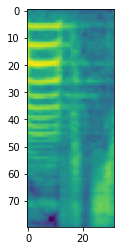

In [ ]:
for epoch in range(10):
    for i in range(1000):
        batch = list(islice(dataloader, 1))[0]
        y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss
        y = y.unsqueeze(1)
        y_audio_pred = generator(x)
        y_audio_pred_mel = melspec_loss(y_audio_pred.squeeze(1)).squeeze(1)
        optim_g.zero_grad()
        loss_mel = F.l1_loss(y_mel, y_audio_pred_mel)
        loss_generator =   45 * loss_mel # loss_gen_s + loss_gen_f +loss_fm_s + loss_fm_f   add for all audios
        if i % 100 == 0:
            print(epoch *1000 + i)
            losses.append(loss_generator)
            print(loss_generator)
            display.display(display.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
            plt.imshow(y_audio_pred_mel.squeeze()[0].cpu().detach().numpy())
            plt.imshow(y_mel.squeeze()[0].cpu().detach().numpy())
        loss_generator.backward()
        optim_g.step()
        scheduler_g.step()
        

In [ ]:
display.display(display.Audio(y.squeeze(1)[0].cpu().detach().numpy(), rate=22050))


In [ ]:
display.display(display.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), rate=22050))

Text(0.5, 1.0, 'predicted')

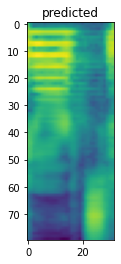

In [ ]:
plt.imshow(y_audio_pred_mel.squeeze()[0].cpu().detach().numpy())
plt.title("predicted")

Text(0.5, 1.0, 'True mel')

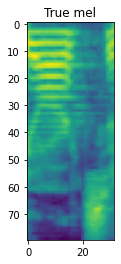

In [ ]:
plt.imshow(y_mel.squeeze()[0].cpu().detach().numpy())
plt.title("True mel")

Text(0.5, 1.0, 'Loss')

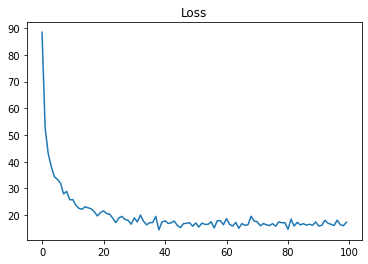

In [ ]:
plt.plot(losses)
plt.title("Loss")

In [ ]:
dataloader = DataLoader(LJSpeechDataset_fullaudio('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device), batch_size=1 )


In [ ]:
ex = list(islice(dataloader, 1))[0][1]
prim = generator(ex)

In [ ]:
prim.shape

torch.Size([1, 1, 212736])

Ground True

In [ ]:
display.display(display.Audio(list(islice(dataloader, 1))[0][0].cpu().detach().numpy(), rate=22050))

Predicted

In [ ]:
display.display(display.Audio(prim.squeeze().cpu().detach().numpy(), rate=22050))

# Train in all dataset

In [ ]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 5.1 MB/s 
     |████████████████████████████████| 180 kB 64.0 MB/s 
     |████████████████████████████████| 140 kB 71.2 MB/s 
     |████████████████████████████████| 97 kB 8.4 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=dd71588857870d07a3d1b0a13fd7ada221d3752f7a7003b4e958b6a8479d29a7
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=cc818459e51e45a67a4d465363b341595671ed8ff6a97ccf89a6175303bd2001
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [ ]:
import wandb

wandb.init(project="TTS_mel2wav", entity="mishaya")

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
import itertools

In [ ]:
from torch.utils.data import  Subset


In [ ]:
dataset = LJSpeechDataset('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device)
train_ratio = 0.95
torch.manual_seed(41)
train_size = int(len(dataset) * train_ratio)
valtidation_size = len(dataset) - train_size 

indexes = torch.randperm(len(dataset))
train_indexes = indexes[:train_size]
validation_indexes = indexes[train_size:]
train_dataset = Subset(dataset, train_indexes)
validation_dataset = Subset(dataset, validation_indexes)

In [ ]:
dataloader_train  = DataLoader(train_dataset, batch_size=16, collate_fn= LJSpeechCollator())
dataloader_valid = DataLoader(validation_dataset, batch_size=16, collate_fn=LJSpeechCollator())

generator = Generator().to(device)
mpd = MPD().to(device)
msd = MSD().to(device)

In [ ]:
generator.load_state_dict(torch.load('/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/generator12.pt'))
mpd.load_state_dict(torch.load('/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/mpd12.pt'))
msd.load_state_dict(torch.load('/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/msd12.pt'))

<All keys matched successfully>

In [ ]:
optim_g = torch.optim.AdamW(generator.parameters(), 0.003, betas=[0.8, 0.99])
optim_disc = torch.optim.AdamW(itertools.chain(msd.parameters(), mpd.parameters()), 0.0002, betas=[0.8, 0.99])
scheduler_g = torch.optim.lr_scheduler.ExponentialLR(optim_g, gamma=0.999, last_epoch=-1)
scheduler_d = torch.optim.lr_scheduler.ExponentialLR(optim_disc, gamma=0.999, last_epoch=-1)

In [ ]:
generator.train()
mpd.train()
msd.train()
None

In [ ]:
melspec = MelSpectrogram(MelSpectrogramConfig()).to(device)
melspec_loss = MelSpectrogram(MelSpectrogramConfig_loss()).to(device)

In [ ]:
batch = list(islice(dataloader_train, 1))[0]

In [ ]:
y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss

In [ ]:
from tqdm import tqdm


In [ ]:
%matplotlib inline

In [ ]:
losses = []

In [ ]:
dataloader_fullaudo = DataLoader(LJSpeechDataset_fullaudio('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device), batch_size=1 )


  0%|          | 0/778 [00:00<?, ?it/s]

0
tensor(45.8815, device='cuda:0', grad_fn=<AddBackward0>)


 13%|█▎        | 100/778 [02:33<17:15,  1.53s/it]

100
tensor(36.8866, device='cuda:0', grad_fn=<AddBackward0>)


 26%|██▌       | 200/778 [05:06<14:41,  1.53s/it]

200
tensor(28.6556, device='cuda:0', grad_fn=<AddBackward0>)


 39%|███▊      | 300/778 [07:38<12:09,  1.53s/it]

300
tensor(28.7791, device='cuda:0', grad_fn=<AddBackward0>)


 51%|█████▏    | 400/778 [10:11<09:38,  1.53s/it]

400
tensor(29.9793, device='cuda:0', grad_fn=<AddBackward0>)


 64%|██████▍   | 500/778 [12:45<07:04,  1.53s/it]

500
tensor(27.0704, device='cuda:0', grad_fn=<AddBackward0>)


 77%|███████▋  | 600/778 [15:17<04:31,  1.52s/it]

600
tensor(28.1301, device='cuda:0', grad_fn=<AddBackward0>)


 90%|████████▉ | 700/778 [17:50<01:58,  1.52s/it]

700
tensor(28.3426, device='cuda:0', grad_fn=<AddBackward0>)


100%|█████████▉| 777/778 [19:49<00:01,  1.53s/it]

0


20


40


Mel-Spectrogram Loss in VALIDATION 0.5109404499937849


  0%|          | 0/778 [00:00<?, ?it/s]

778
tensor(28.4053, device='cuda:0', grad_fn=<AddBackward0>)


 13%|█▎        | 100/778 [02:33<17:21,  1.54s/it]

878
tensor(26.9261, device='cuda:0', grad_fn=<AddBackward0>)


 26%|██▌       | 200/778 [05:06<14:41,  1.53s/it]

978
tensor(27.8635, device='cuda:0', grad_fn=<AddBackward0>)


 39%|███▊      | 300/778 [07:39<12:07,  1.52s/it]

1078
tensor(26.0163, device='cuda:0', grad_fn=<AddBackward0>)


 51%|█████▏    | 400/778 [10:12<09:36,  1.53s/it]

1178
tensor(26.3526, device='cuda:0', grad_fn=<AddBackward0>)


 64%|██████▍   | 500/778 [12:45<07:02,  1.52s/it]

1278
tensor(28.4146, device='cuda:0', grad_fn=<AddBackward0>)


 77%|███████▋  | 600/778 [15:15<04:25,  1.49s/it]

1378
tensor(27.9564, device='cuda:0', grad_fn=<AddBackward0>)


 90%|████████▉ | 700/778 [17:45<01:56,  1.50s/it]

1478
tensor(28.5048, device='cuda:0', grad_fn=<AddBackward0>)


100%|█████████▉| 777/778 [19:42<00:01,  1.52s/it]

0


20


40


Mel-Spectrogram Loss in VALIDATION 0.4587828284356652


  0%|          | 0/778 [00:00<?, ?it/s]

1556
tensor(26.9637, device='cuda:0', grad_fn=<AddBackward0>)


 13%|█▎        | 100/778 [02:30<16:51,  1.49s/it]

1656
tensor(27.6931, device='cuda:0', grad_fn=<AddBackward0>)


 26%|██▌       | 200/778 [05:00<14:23,  1.49s/it]

1756
tensor(27.3625, device='cuda:0', grad_fn=<AddBackward0>)


 39%|███▊      | 300/778 [07:30<11:54,  1.49s/it]

1856
tensor(28.4079, device='cuda:0', grad_fn=<AddBackward0>)


 51%|█████▏    | 400/778 [10:00<09:25,  1.50s/it]

1956
tensor(28.2792, device='cuda:0', grad_fn=<AddBackward0>)


 64%|██████▍   | 500/778 [12:30<06:55,  1.50s/it]

2056
tensor(27.1439, device='cuda:0', grad_fn=<AddBackward0>)


 77%|███████▋  | 600/778 [15:00<04:26,  1.50s/it]

2156
tensor(28.3188, device='cuda:0', grad_fn=<AddBackward0>)


 90%|████████▉ | 700/778 [17:30<01:56,  1.49s/it]

2256
tensor(26.5032, device='cuda:0', grad_fn=<AddBackward0>)


100%|█████████▉| 777/778 [19:27<00:01,  1.50s/it]

0


20


40


Mel-Spectrogram Loss in VALIDATION 0.45065762138948207


  0%|          | 0/778 [00:00<?, ?it/s]

2334
tensor(27.3631, device='cuda:0', grad_fn=<AddBackward0>)


 13%|█▎        | 100/778 [02:30<16:54,  1.50s/it]

2434
tensor(26.4884, device='cuda:0', grad_fn=<AddBackward0>)


 26%|██▌       | 200/778 [05:00<14:24,  1.50s/it]

2534
tensor(26.2167, device='cuda:0', grad_fn=<AddBackward0>)


 39%|███▊      | 300/778 [07:31<11:55,  1.50s/it]

2634
tensor(26.3924, device='cuda:0', grad_fn=<AddBackward0>)


 51%|█████▏    | 400/778 [10:01<09:25,  1.50s/it]

2734
tensor(25.8889, device='cuda:0', grad_fn=<AddBackward0>)


 64%|██████▍   | 500/778 [12:32<06:56,  1.50s/it]

2834
tensor(25.8168, device='cuda:0', grad_fn=<AddBackward0>)


 77%|███████▋  | 600/778 [15:02<04:26,  1.50s/it]

2934
tensor(26.2017, device='cuda:0', grad_fn=<AddBackward0>)


 90%|████████▉ | 700/778 [17:32<01:56,  1.50s/it]

3034
tensor(25.0912, device='cuda:0', grad_fn=<AddBackward0>)


100%|█████████▉| 777/778 [19:30<00:01,  1.51s/it]

0


20


40


Mel-Spectrogram Loss in VALIDATION 0.44503329657926793


  0%|          | 0/778 [00:00<?, ?it/s]

3112
tensor(26.6909, device='cuda:0', grad_fn=<AddBackward0>)


 13%|█▎        | 100/778 [02:30<16:53,  1.50s/it]

3212
tensor(25.9042, device='cuda:0', grad_fn=<AddBackward0>)


 26%|██▌       | 200/778 [05:00<14:22,  1.49s/it]

3312
tensor(24.4720, device='cuda:0', grad_fn=<AddBackward0>)


 39%|███▊      | 300/778 [07:31<11:54,  1.50s/it]

3412
tensor(27.3703, device='cuda:0', grad_fn=<AddBackward0>)


 51%|█████▏    | 400/778 [10:01<09:25,  1.49s/it]

3512
tensor(25.6301, device='cuda:0', grad_fn=<AddBackward0>)


 61%|██████    | 471/778 [11:50<07:42,  1.51s/it]


KeyboardInterrupt: ignored

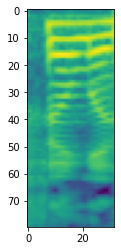

In [ ]:
for epoch in range(100):
    for i, batch in islice(enumerate(tqdm(dataloader_train)),len(dataloader_train)):

        y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss
        y = y.unsqueeze(1)
        y_audio_pred = generator(x)

        y_audio_pred_mel = melspec_loss(y_audio_pred.squeeze(1)).squeeze(1)

        optim_disc.zero_grad()
        y_df_hat_r, y_df_hat_g, _, _ = mpd(y, y_audio_pred.detach())
        loss_disc_f, losses_disc_f_r, losses_disc_f_g = discriminator_loss(y_df_hat_r, y_df_hat_g)
        y_ds_hat_r, y_ds_hat_g, _, _ = msd(y, y_audio_pred.detach())
        loss_disc_s, losses_disc_s_r, losses_disc_s_g = discriminator_loss(y_ds_hat_r, y_ds_hat_g)
        loss_discriminator = loss_disc_s + loss_disc_f
        loss_discriminator.backward()
        optim_disc.step()

        optim_g.zero_grad()

        loss_mel = F.l1_loss(y_mel, y_audio_pred_mel)


        y_df_hat_r, y_df_hat_g, fmap_f_r, fmap_f_g = mpd(y, y_audio_pred)
        y_ds_hat_r, y_ds_hat_g, fmap_s_r, fmap_s_g = msd(y, y_audio_pred)
        loss_fm_f = feature_matching_loss(fmap_f_r, fmap_f_g)
        loss_fm_s = feature_matching_loss(fmap_s_r, fmap_s_g)
        loss_gen_f, losses_gen_f = generator_loss(y_df_hat_g)
        loss_gen_s, losses_gen_s = generator_loss(y_ds_hat_g)
        loss_generator =   45 * loss_mel + loss_gen_s + loss_gen_f +loss_fm_s + loss_fm_f
        wandb.log({"loss generator": loss_generator,
                   "loss discriminator:": loss_discriminator,
                   "Mel-Spectrogram Loss in TRAIN": loss_mel})
        
        loss_generator.backward()
        optim_g.step()
        scheduler_g.step()
        scheduler_d.step()

        if i % 100 == 0:
            print(epoch * len(dataloader_train) + i)
            losses.append(loss_generator)
            print(loss_generator)
            display.display(display.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
            plt.imshow(y_audio_pred_mel.squeeze()[0].cpu().detach().numpy())
            plt.imshow(y_mel.squeeze()[0].cpu().detach().numpy())

            ex = list(islice(dataloader_fullaudo, 1))[0][1]
            prim = generator(ex)

            wandb.log({
                "Audio valid every n step": [wandb.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), caption="Audio in train", sample_rate=22050)],
                "Audio in train ground true": [wandb.Audio(y.squeeze(1)[0].cpu().detach().numpy(), caption="Audio in train ground true", sample_rate=22050)],
                "Example of audio": [wandb.Audio(prim.squeeze().cpu().detach().numpy(), caption="Example of audio", sample_rate=22050)],
                "Spec train ": [wandb.Image(plt.imshow(y_audio_pred_mel.squeeze()[0].cpu().detach().numpy()), caption="Spec train ")],
                "Spec train GroundTrue": [wandb.Image(plt.imshow(y_mel.squeeze()[0].cpu().detach().numpy()), caption="Spec train GroundTrue")]
                })
            

    generator.eval()
    val_err_tot = 0
    with torch.no_grad():
        for j, batch in enumerate(dataloader_valid):
            y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss
            y = y.unsqueeze(1)
            y_audio_pred = generator(x)
            y_audio_pred_mel = melspec_loss(y_audio_pred.squeeze(1)).squeeze(1)
            if j % 20 == 0:
                print(j)
                display.display(display.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
                display.display(display.Audio(y.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
            val_err_tot += F.l1_loss(y_mel, y_audio_pred_mel).item()
        val_err = val_err_tot / (j+1)
        wandb.log({"Mel-Spectrogram Loss in VALIDATION": val_err})
        print("Mel-Spectrogram Loss in VALIDATION", val_err)
    generator.train()
    torch.save(generator.state_dict(),f'/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/generator_try4{epoch}.pt') 
    torch.save(mpd.state_dict(),f'/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/mpd_try4{epoch}.pt') 
    torch.save(msd.state_dict(),f'/content/drive/MyDrive/AUDIO_DLA/TTS GAN/log/msd_try4{epoch}.pt') 
        

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataloader_fullaudo = DataLoader(LJSpeechDataset_fullaudio('.', MelSpectrogramConfig(), MelSpectrogramConfig_loss(), device), batch_size=1 )


In [ ]:
ex = list(islice(dataloader_fullaudo, 1))[0][1]
prim = generator(ex)

In [ ]:
display.display(display.Audio(list(islice(dataloader_fullaudo, 1))[0][0].squeeze().cpu().detach().numpy(), rate=22050))

In [ ]:
display.display(display.Audio(prim.squeeze().cpu().detach().numpy(), rate=22050))

try1

In [ ]:
display.display(display.Audio(prim.squeeze().cpu().detach().numpy(), rate=22050))

In [ ]:
# torchaudio.save("audio.wav", prim.cpu().squeeze(1), 22050)

try2


In [ ]:
ex = list(islice(dataloader_fullaudo, 5))[4][1]
prim = generator(ex)

In [ ]:
display.display(display.Audio(prim.squeeze().cpu().detach().numpy(), rate=22050))

In [ ]:
generator.eval()
torch.cuda.empty_cache()
val_err_tot = 0
with torch.no_grad():
    for j, batch in enumerate(dataloader_valid):
        y, x, y_mel = batch.waveform, batch.mels, batch.mel_loss
        y = y.unsqueeze(1)
        y_audio_pred = generator(x)
        y_audio_pred_mel = melspec_loss(y_audio_pred.squeeze(1)).squeeze(1)
        if j % 5 == 0:
            print(j)
            display.display(display.Audio(y_audio_pred.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
            display.display(display.Audio(y.squeeze(1)[0].cpu().detach().numpy(), rate=22050))
        val_err_tot += F.l1_loss(y_mel, y_audio_pred_mel).item()
    val_err = val_err_tot / (j+1)
    print(val_err)

0


5


10


15


20


25


30


35


40


0.43925823380307455


# Test on audio

In [ ]:
def audio2audio(path):
    waveform, sample_rate = torchaudio.load(path)
    mel = melspec(waveform.to(device)).squeeze()
    aud = generator(mel.unsqueeze(0)).squeeze().cpu().detach()
    display.display(display.Audio(aud.numpy(), rate=22050))
    torchaudio.save(path[:-4] + "_generated_speesch.wav", aud.unsqueeze(0), sample_rate)

In [ ]:
audio2audio("/content/audio_1.wav")

In [ ]:
audio2audio("/content/audio_2.wav")

In [ ]:
audio2audio("/content/audio_3.wav")

# Отчет

В этой работе была реализована модель для преобразования мел спектограмму в аудио, за основу взята статья [HiFi-GAN: Generative Adversarial Networks for
Efficient and High Fidelity Speech Synthesis](https://arxiv.org/pdf/2010.05646.pdf), 

### Результаты

В данном разделе вы можете прослушать wav сгенерированные моделью на основе аудио предоставленными преподователсями/ассистентами. Прослушав аудио модно подвести итог, что модель выучила закономерности в мел спекторамме и может сгенериватать речь, также отмечу что аудио предсавленные нам отличаются от спикером от того на чем она обучалась, а именно на LJSPEECH. Результат получился неплохим, можно понять текст представленный в аудио. Все аудио кроме последнего звучат хорошо, но есть нестабильности

In [ ]:
audio2audio("/content/audio_1.wav")

In [ ]:
audio2audio("/content/audio_2.wav")

In [ ]:
audio2audio("/content/audio_3.wav")

### Обучение



Процесс обучеия сети можно посмотреть по ссылке [WANDB](https://wandb.ai/mishaya/TTS_mel2wav?workspace=user-mishaya )



Обучение состоит из 3 прогонов, vague-sun-1, desert-frog-2, jumping-waterfall-3, sandy-sunset-5. Все обудечния кроме desert-frog-2, происходи с одинаковыми параметрами

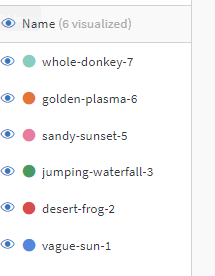

vague-sun-1 этой 1 этап обучения, состоит из 8000 итераций, в результате gecoder, выдает мел спректоргаама сгенерированного аудио, начинает станоится похожей на мел спекограмму оригинальной вавки. Графики loss, и послушать сгенерированное аудио можно посмотреть в wandb

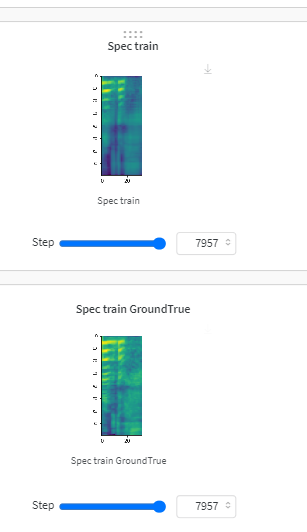

vague-sun-1 --> desert-frog-2, использовались пердыдущие сохраненные веса модели прогон desert-frog-2, не увеначался успехом, так на данном этапе loss генератора перестал падать, а начал расти, а loss дискрименатора начал падать сильно. На 2000 истерации я решил остановить обучение и вернуться к предыдущим весам модели. Причина почему так повели себя графики данная строка кода, котрая применялась сразу после разивания батча на mel, x , y

```
x = torch.autograd.Variable(x.to(device, non_blocking=True)) 
y = torch.autograd.Variable(y.to(device, non_blocking=True)) 
mel = torch.autograd.Variable(mel.to(device, non_blocking=True)) 


```



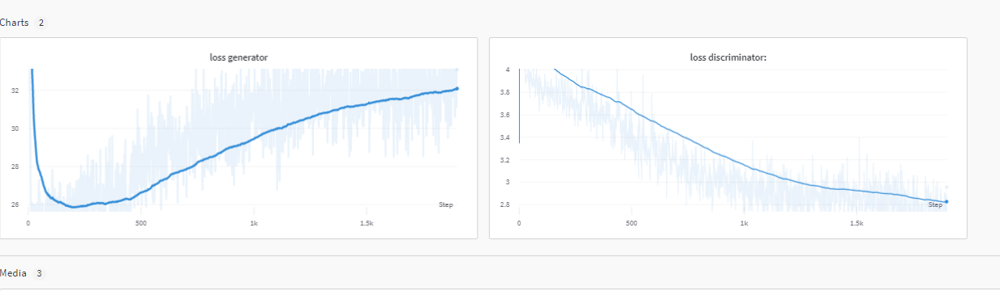

vague-sun-1 --> jumping-waterfall-3. В этот раз обучение происходило без torch.autograd.Variable(). В резульате прогона еще на 10'000 итерациях loss генератора упал до 26. Мел спектограммы становятся очень похожими

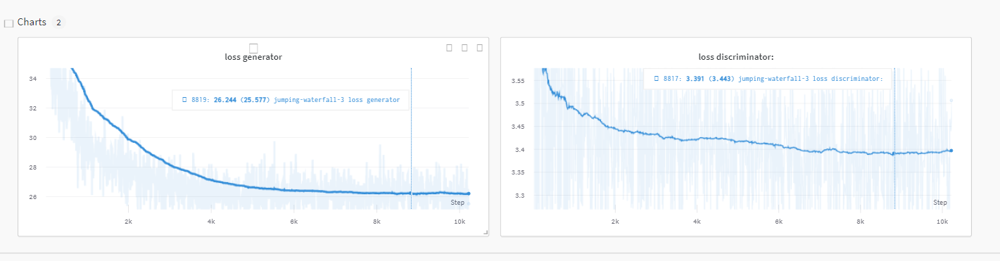

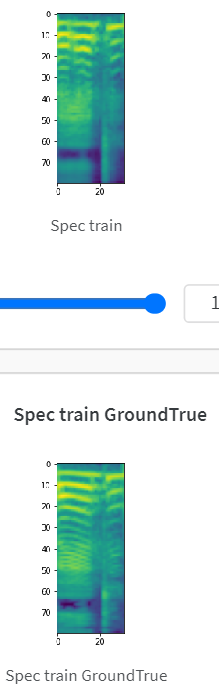

vague-sun-1 --> jumping-waterfall-3 --> sandy-sunset-5. В результате прогона еще на 3000 итрациях. Модель обучилсь еще лучше и  loss L1 между мел спектограммами сотсавляет 0.44-0.46. Также можно увидеть что модель не переобучилась под обучающаю выборку, так как loss на валидации продолжает падать

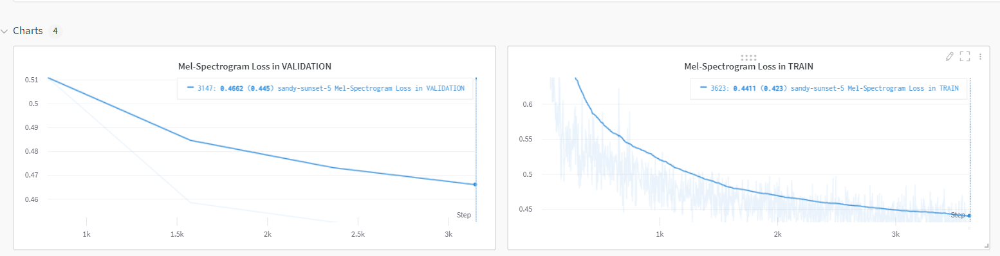

Можно еще продолжить оубчение модели, так как обучение не вышло на плато. Но из-за нехватки времени решил остановися на данном результатае.

Общее время обучении составляет 8-10 часов на V100, с батчем 16, и общем количестве итераций 21 000.

Также в wandb есть медиа Example of audio, котрое показывает возможноти генератора на полном аудио

### Запуск модели

Для того чтобы заупсть train.py нужно прописать путь до весов генератора и дискрименаторов, также пути чекпоинта для сохранения на диске в config.py 



```
path_generator = "/content/generator_try44.pt"
path_mpd = "/content/mpd_try44.pt"
path_msd: str = "/content/msd_try44.pt"


path2predictaudio = "/content/TTS-HiFi-GAN/audio2predict"

path_gen_checkpoint = "..."
path_mpd_checkpoint = "..."
path_msd_checkpoint = "..."
```



Веса модели можно скачать при помощи строчек


```
!gdown --id  1-Ry5HYdy4L7JkCNR7ArLzlS4WCvPc1O1
!gdown --id  1-QQEgadcPG1Sz_Pa3dM7wf2KtBAaAsKo
!gdown --id  1-RzbkyDfHAvUpVU3A9P625CKDXiqrokN
```



!Пример запука **train.py** и **test.py** представлен в ноутбуке **Git.ipynb**!!

train.py представляет из себя train loop

test.py генерирует аудои из аудио, посредством представлении исходного аудио в MEl, а из mel --> audio при помощи генератора

test.py сохраняет сгенерированные аудио в той же директории, как и указна в переменной path2predictaudio в config.py с добаление в назвние исходного аудио "_generated_speesch.wav"

### Трудности

При написании всего этого кода возникали проблемы, такие как cuda out of mamory, но они в итоге решились посредством того, что мы обучали только на кусках аудио из 8192 семпла, а не на всем аудио. На помощи пришел исходный код к статье на [github](https://github.com/jik876/hifi-gan)

, котрые прикрепили исследователи и он помогал не раз при написании кода.